## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

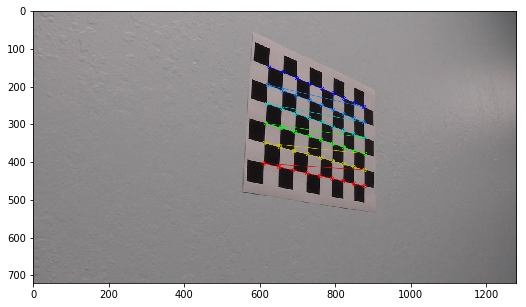

In [8]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
#         cv2.imshow('img',img)
#         cv2.waitKey(500)

# cv2.destroyAllWindows()
plt.figure(figsize=(10, 5))
plt.imshow(img)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

## Apply distortion correction to images

In [76]:
def display_side_by_side(original_img, modified_img, title1, title2, bgr2rgb=False, is_file_path=False):
    
    if is_file_path:
        original_img = cv2.read(original_img)
        modified_img = cv2.read(modified_img)
    if bgr2rgb:
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
        modified_img = cv2.cvtColor(modified_img, cv2.COLOR_BGR2RGB)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
    fig.tight_layout()
    ax1.imshow(original_img)
    ax1.set_title(title1, fontsize=25)
    ax2.imshow(modified_img)
    ax2.set_title(title2, fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

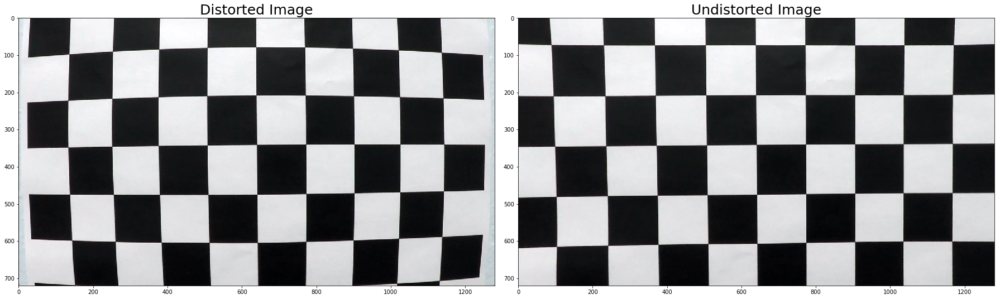

In [34]:
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

distorted_img = cv2.imread('./camera_cal/calibration1.jpg')
undistorted_img = cal_undistort(distorted_img, objpoints, imgpoints)

display_side_by_side(distorted_img, undistorted_img, 'Distorted Image', 'Undistorted Image')

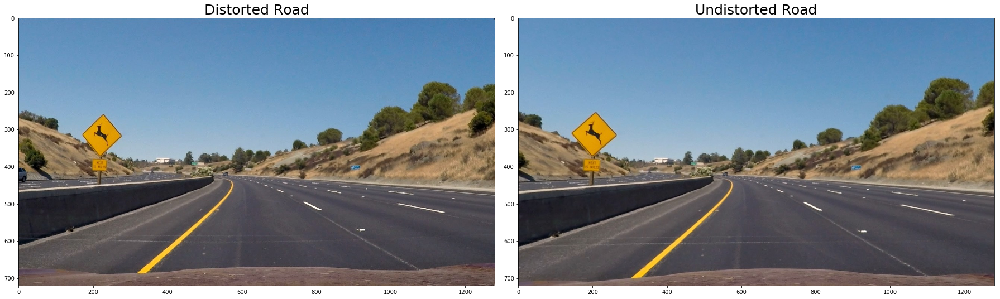

In [36]:
test_img = cv2.imread('./test_images/test2.jpg')
undistorted_road = cv2.undistort(test_img, mtx, dist, None, mtx)
cv2.imwrite('./output_images/test2_undistorted.jpg', undistorted)

display_side_by_side(test_img, undistorted_road, 'Distorted Road', 'Undistorted Road', bgr2rgb=True)

In [37]:
def combine_threshold(img, s_thresh=(180, 255), sx_thresh=(20, 100)):
    # Saturation Filters
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    s_channel = hls[:,:,2]
    
    # Color Filters
    low_white = np.array([0, 0, 225], dtype=np.uint8)
    high_white = np.array([90,70,255], dtype=np.uint8)
    low_yellow = np.array([14,120,220], dtype=np.uint8)
    high_yellow = np.array([30,255,255], dtype=np.uint8)
    
    s_mask = cv2.inRange(s_channel, s_thresh[0], s_thresh[1])

    white_mask = cv2.inRange(hls, low_white, high_white)
    yellow_mask = cv2.inRange(hls, low_yellow, high_yellow)
    
    color_mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    binary = cv2.bitwise_or(color_mask, s_mask)

    return binary

True

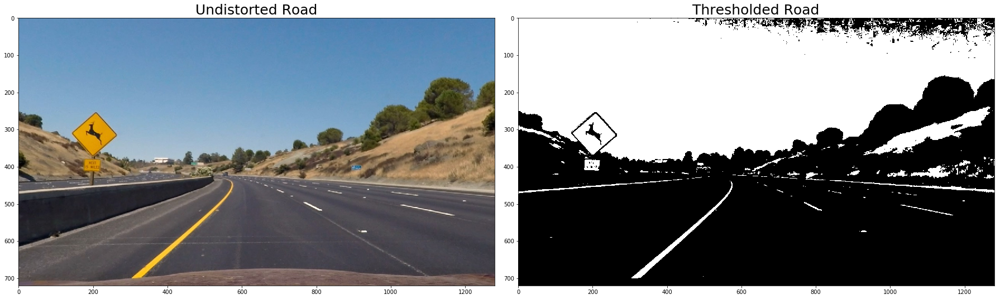

In [44]:
thresholded_img = combine_threshold(undistorted_road)

undistorted_road = cv2.cvtColor(undistorted_road, cv2.COLOR_BGR2RGB)

# Plot the result images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
fig.tight_layout()

ax1.imshow(undistorted_road)
ax1.set_title('Undistorted Road', fontsize=25)

ax2.imshow(thresholded_img, cmap='gray')
ax2.set_title('Thresholded Road', fontsize=25)

cv2.imwrite('./output_images/test2_thresholded.jpg', thresholded_img)

In [45]:
def warp_image(img, src_points, dest_points):
    M = cv2.getPerspectiveTransform(src_points, dest_points)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    return warped

True

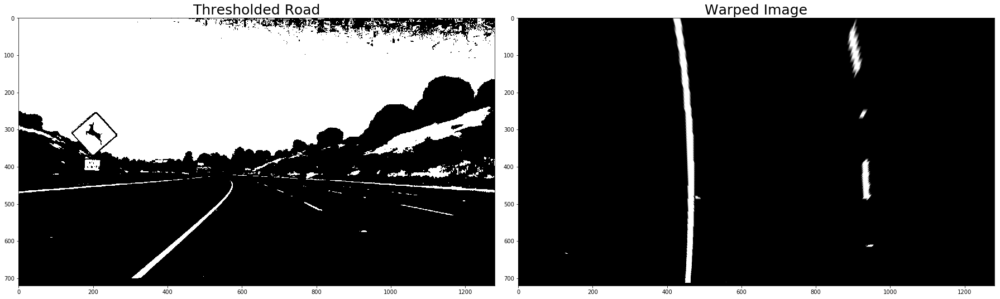

In [47]:
# Isoscel Trapezoid 
src_points = np.float32([[150, 720], # bottom left
 [1130, 720], # bottom right
 [500, 460], # top left
 [740, 460]]) # top right
dest_points = np.float32([[380, 720],
 [900, 720],
 [150, 0],
 [1080, 0]])

warped_image = warp_image(thresholded_img, src_points, dest_points)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.tight_layout()

ax1.imshow(thresholded_img, cmap='gray')
ax1.set_title('Thresholded Road', fontsize=25)

ax2.imshow(warped_image, cmap='gray')
ax2.set_title('Warped Image', fontsize=25)

cv2.imwrite('./output_images/test2_warped.jpg', warped_image)

In [48]:
def find_lane_pixels(warped_image):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped_image[warped_image.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    image_lanes = np.dstack((warped_image, warped_image, warped_image))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(warped_image.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_image.shape[0] - (window+1)*window_height
        win_y_high = warped_image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(image_lanes,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(image_lanes,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, image_lanes


def fit_polynomial(warped_image):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, image_lanes = find_lane_pixels(warped_image)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('Failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    image_lanes[lefty, leftx] = [255, 0, 0]
    image_lanes[righty, rightx] = [0, 0, 255]

    return image_lanes, left_fit, right_fit, ploty, leftx, lefty, rightx, righty

True

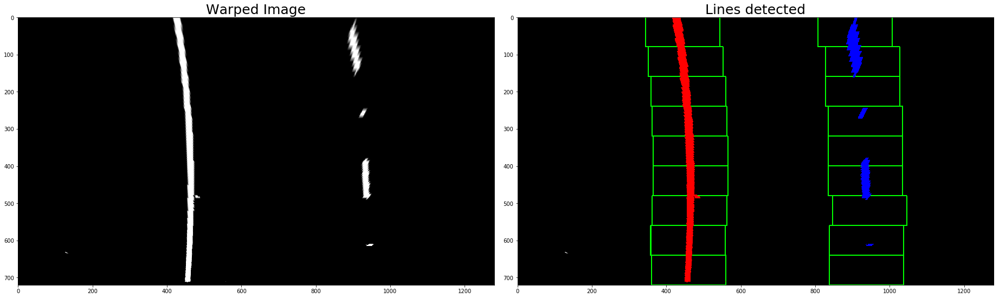

In [49]:
image_lanes, left_fit, right_fit, ploty, leftx, lefty, rightx, righty = fit_polynomial(warped_image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.tight_layout()

ax1.imshow(warped_image, cmap='gray')
ax1.set_title('Warped Image', fontsize=25)

ax2.imshow(image_lanes)
ax2.set_title('Lines detected', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

cv2.imwrite('./output_images/test2_detected_lines.jpg', image_lanes)

In [50]:
def measure_curvature_real(left_fit, right_fit, ploty, leftx, lefty, rightx, righty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension 

    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # Maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(lefty)
    
    # Calculation of R_curve (radius of curvature)
    # https://www.intmath.com/applications-differentiation/8-radius-curvature.php
    left_R_curve = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_R_curve = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    #Mean value
    R_curve = np.float32((left_R_curve + right_R_curve)/2)
    
    return R_curve

In [51]:
def measure_distance_from_center(leftx, lefty, rightx, righty, center):
        
        left_fit = np.polyfit(lefty, leftx, 2)
        left_x = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
        right_fit = np.polyfit(righty, rightx, 2)
        right_x = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
        
        center_lane = np.float32((right_x + left_x) / 2)
        
        m_per_pixel = 3.7 / 1000
    
        distances_from_center = np.float32(np.abs(center - center_lane) * m_per_pixel)
        
        distance_from_center = 0
        distance_sum = 0
        i = 0
        
        for i in range(distances_from_center.shape[0]):
            distance_sum += distances_from_center[i]
            
        distance_from_center = distance_sum/i
        return distance_from_center

In [53]:
R_curve = measure_curvature_real(left_fit, right_fit, ploty, leftx, lefty, rightx, righty)
center = (test_img.shape[0] / 2)
distance_from_center = measure_distance_from_center(leftx, lefty, rightx, righty, center)
print(distance_from_center)

1.2627603675460328


In [59]:
def warped_draw_lane(warped_image, left_fit, right_fit, ploty):
    
    lane_drawn = np.zeros_like(np.dstack((warped_image, warped_image, warped_image))*255)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Plots the left and right polynomials on the lane lines
    left_lane = np.vstack((left_fitx, ploty)).T.astype(np.int32)
    right_lane = np.vstack((right_fitx, ploty)).T.astype(np.int32)
    area = np.concatenate((left_lane, right_lane[::-1]))

    cv2.polylines(lane_drawn, [left_lane], isClosed=False, color=(200,50,50), thickness=40)
    cv2.polylines(lane_drawn, [right_lane], isClosed=False, color=(200,50,50), thickness=50)
    cv2.fillConvexPoly(lane_drawn, area, color=(100,255,100))
    return lane_drawn

True

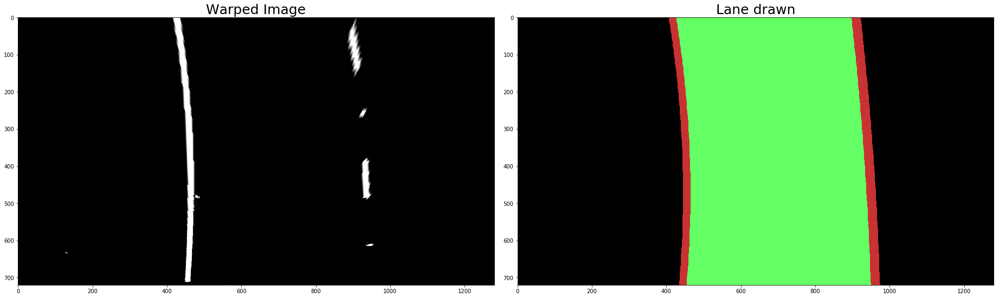

In [61]:
warped_lane_drawn = warped_draw_lane(warped_image, left_fit, right_fit, ploty)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.tight_layout()

ax1.imshow(warped_image, cmap='gray')
ax1.set_title('Warped Image', fontsize=25)

ax2.imshow(warped_lane_drawn)
ax2.set_title('Lane drawn', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

cv2.imwrite('./output_images/test2_lane_drawn.jpg', warped_lane_drawn)

True

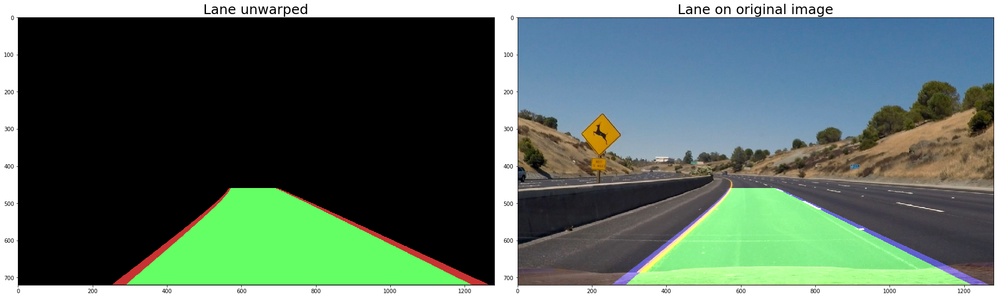

In [68]:
lane_drawn = warp_image(warped_lane_drawn, dest_points, src_points)
road_lane = cv2.addWeighted(test_img, 0.9, lane_drawn, .7,0)

road_lane = cv2.cvtColor(road_lane, cv2.COLOR_BGR2RGB)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.tight_layout()

ax1.imshow(lane_drawn, cmap='gray')
ax1.set_title('Lane unwarped', fontsize=25)

ax2.imshow(road_lane)
ax2.set_title('Lane on original image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

cv2.imwrite('./output_images/test2_lane_drawn_on_original_img.jpg', road_lane)

In [66]:
def draw_radius_center(img, R_curve, distance_from_center):
    output_image = img.copy()
    cv2.putText(output_image, 'Radius of curvature is {:.2f}m'.format(R_curve),(50, 70),cv2.FONT_HERSHEY_DUPLEX,2,(255, 255, 255),2)
    cv2.putText(output_image, 'Distance from center is {:.2f}m'.format(distance_from_center),(50, 140),cv2.FONT_HERSHEY_DUPLEX,2,(255, 255, 255),2)
    return output_image

True

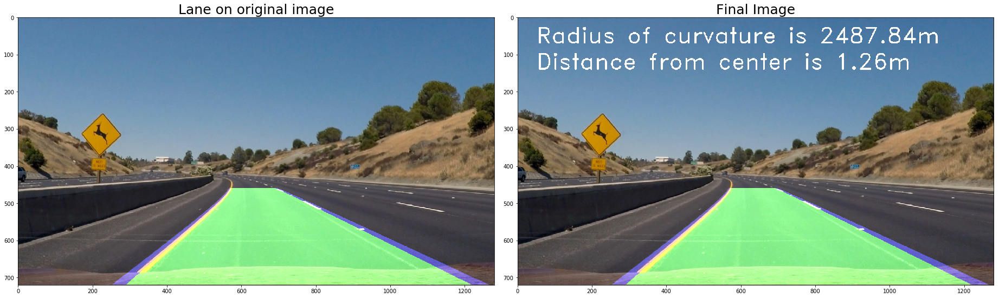

In [94]:
final_image = draw_radius_center(road_lane, R_curve, distance_from_center)

final_image = cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB)

road_lane = cv2.cvtColor(road_lane, cv2.COLOR_BGR2RGB)

display_side_by_side(road_lane, final_image, 'Lane on original image', 'Final Image')

cv2.imwrite('./output_images/test2_final_img.jpg', final_image)

In [72]:
def pipeline(img):
    # 1. Undistort image
    road_undistorted = cal_undistort(img, objpoints, imgpoints)
    
    # 2. Threshold image
    image_thresholded = combine_threshold(road_undistorted)
    
    # 3. Perspective transform
    warped_image = warp_image(image_thresholded, src_points, dest_points)
    
    # 4. Lines finding
    image_lanes, left_fit, right_fit, ploty, leftx, lefty, rightx, righty = fit_polynomial(warped_image)
    
    # 5. Lane drawing
    warped_lane_drawn = warped_draw_lane(warped_image, left_fit, right_fit, ploty)
    
    # 6. Warp back the image
    lane_drawn = warp_image(warped_lane_drawn, dest_points, src_points)
    road_lane = cv2.addWeighted(img,0.9,lane_drawn,.7,0)
    
    # 7. Text printing
    R_curve = measure_curvature_real(left_fit, right_fit, ploty, leftx, lefty, rightx, righty)
    distance_from_center = measure_distance_from_center(leftx, lefty, rightx, righty, center)
    final_image = draw_radius_center(road_lane, R_curve, distance_from_center)

    return final_image

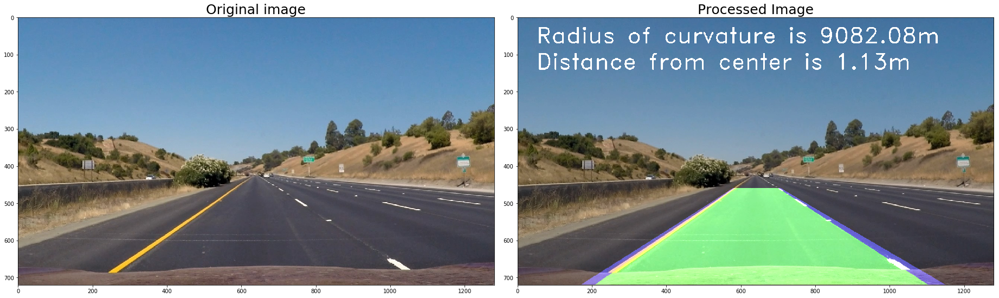

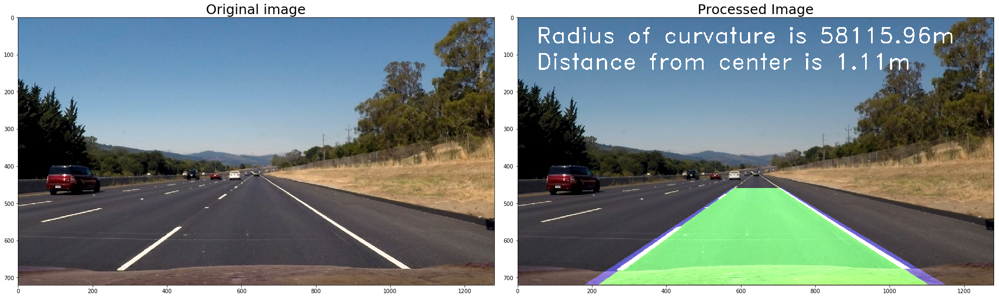

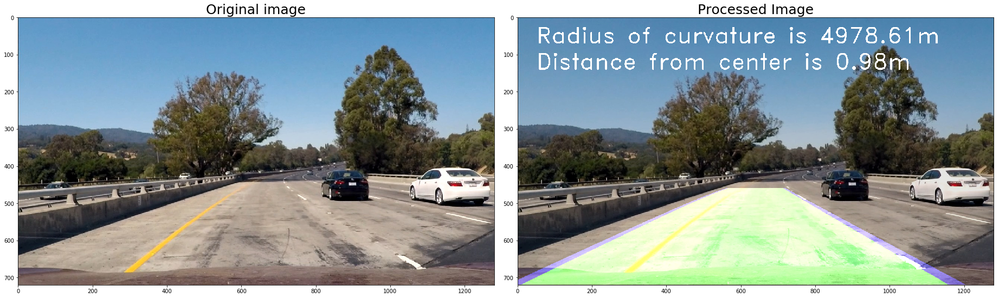

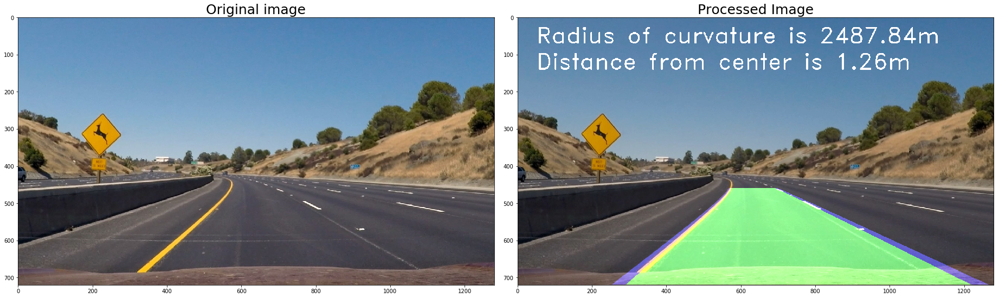

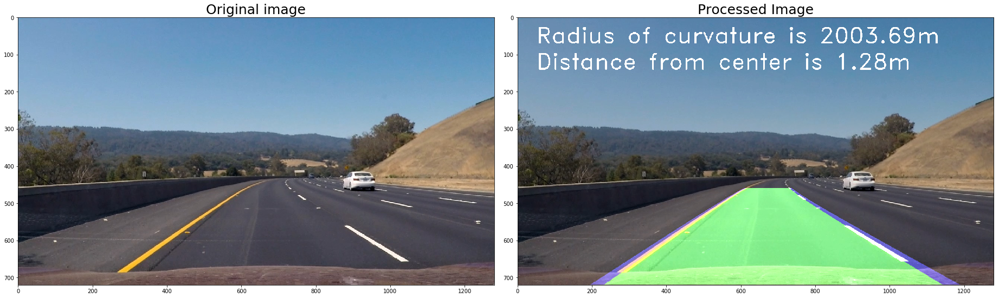

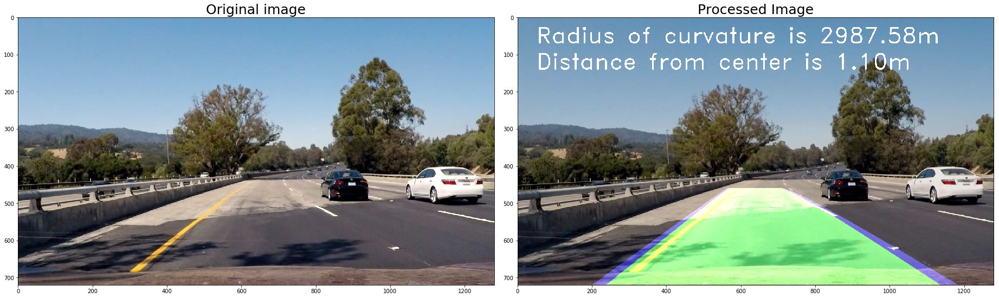

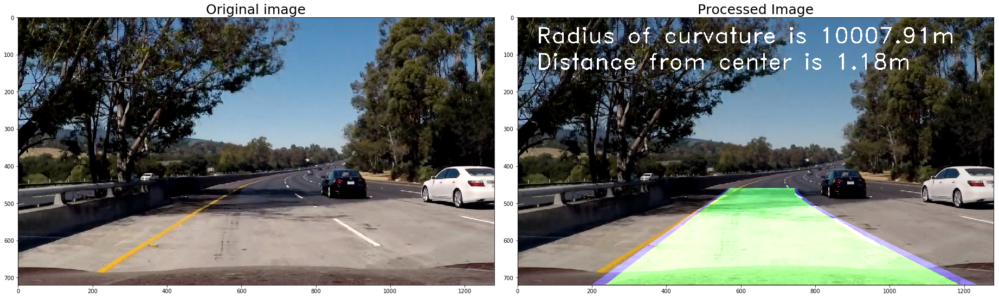

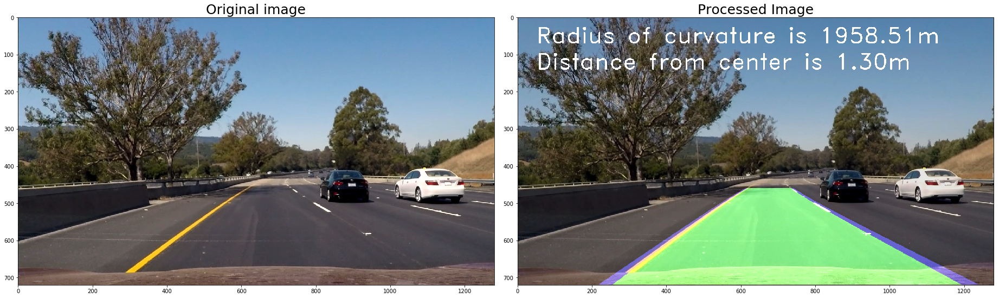

In [87]:
for file in glob.glob('test_images/*.jpg'):
    output_file_path = "./output_images/processed_" + file.split("\\")[1]
    
    original_img = cv2.imread(file)
    processed_img = pipeline(original_img)

    display_side_by_side(original_img, processed_img, 'Original image', 'Processed Image', bgr2rgb=True)
    cv2.imwrite(output_file_path, processed_img)

In [91]:
from moviepy.editor import VideoFileClip

clip = VideoFileClip('project_video.mp4')
clip_annotated = clip.fl_image(pipeline)
%time clip_annotated.write_videofile('output_project_video.mp4', audio=False)

t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_project_video.mp4.
Moviepy - Writing video output_project_video.mp4



Moviepy - Done !
Moviepy - video ready output_project_video.mp4
Wall time: 23min 9s


In [92]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('output_project_video.mp4'))